# Compare models

In [1]:
import os

In [2]:
import io
import numpy as np
import requests
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_hub as hub
from PIL import Image as PILImage

C:\Users\win10\.conda\envs\yyjj125\lib\site-packages\scipy\__init__.py:155: UserWarning: A NumPy version >=1.18.5 and <1.25.0 is required for this version of SciPy (detected version 1.25.2
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [3]:
from transformers import AutoImageProcessor, TFSegformerForSemanticSegmentation

In [4]:
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

In [5]:
IMAGE_WIDTH = 512
IMAGE_HEIGHT = 512

keras_layer = hub.KerasLayer('https://tfhub.dev/google/edgetpu/vision/deeplab-edgetpu/default_argmax/s/1')
model1 = tf.keras.Sequential([keras_layer])
model1.build([None, IMAGE_WIDTH, IMAGE_HEIGHT, 3])

image_processor = AutoImageProcessor.from_pretrained("nvidia/segformer-b0-finetuned-ade-512-512")
model2 = TFSegformerForSemanticSegmentation.from_pretrained("nvidia/segformer-b0-finetuned-ade-512-512")

image_files = os.listdir(image_dir)

Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089
Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration.
C:\Users\win10\.conda\envs\yyjj125\lib\site-packages\transformers\models\segformer\image_processing_segformer.py:99: FutureWarning: The `reduce_labels` parameter is deprecated and will be removed in a future version. Please use `do_reduce_labels` instead.
  warnings.warn(


All model checkpoint layers were used when initializing TFSegformerForSemanticSegmentation.

All the layers of TFSegformerForSemanticSegmentation were initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFSegformerForSemanticSegmentation for predictions without further training.


In [9]:
import matplotlib

In [12]:
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches

In [41]:
# deeplab labels
tree1 = 5
grass1 = 10
shrub1 = 18

# SegFormer labels
tree2 = 4
grass2 = 9
shrub2 = 17

# color map for both models
color_map = {
    -1: [0, 0, 0], 
    tree1: [0, 238, 0],  
    grass1: [238, 238, 0],  
    shrub1: [125, 38, 205],  
    tree2: [0, 238, 0],  
    grass2: [238, 238, 0],  
    shrub2: [125, 38, 205]  
}

color_map_legend = {
    "Tree": [0, 238, 0],  
    "Grass": [238, 238, 0],  
    "Shrub": [125, 38, 205], 
}

legend_elements = [mpatches.Patch(color=np.array(color)/255, label=label) 
                   for label, color in color_map_legend.items()]


In [42]:
image_dir = 'compare_model'

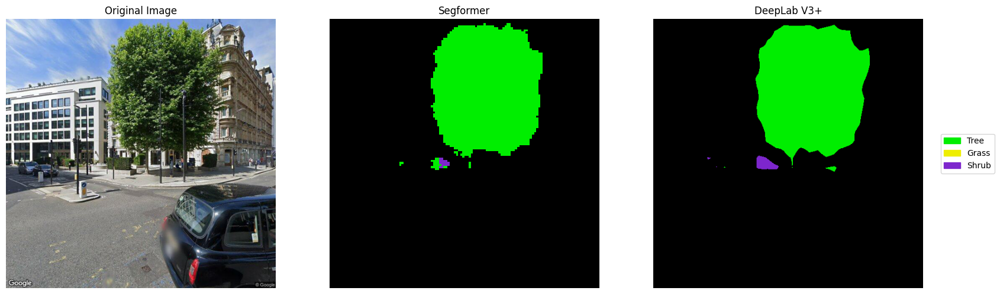

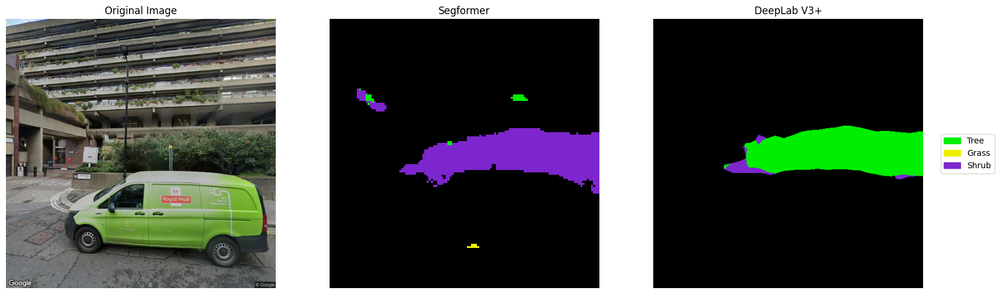

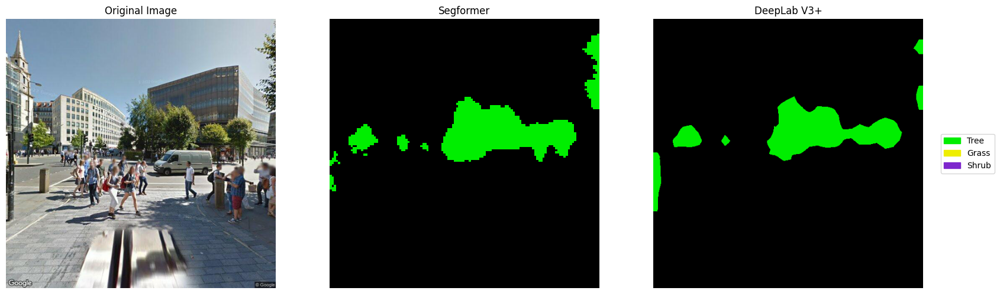

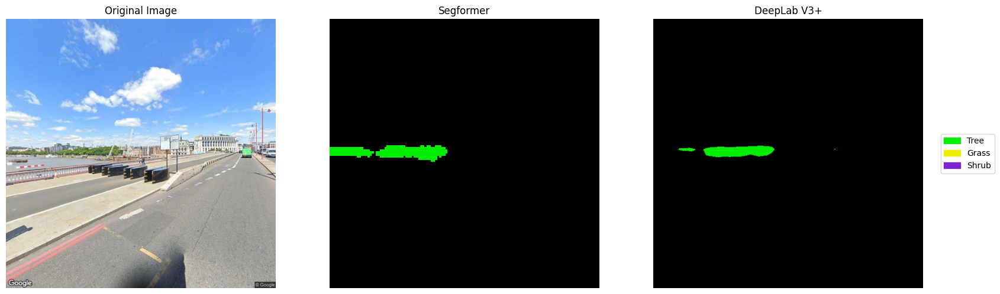

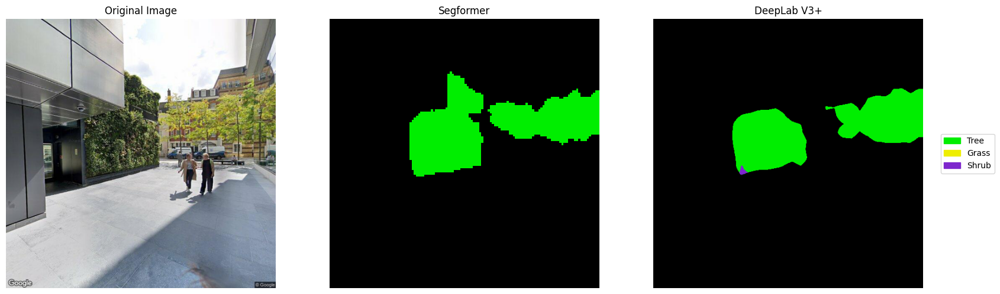

...

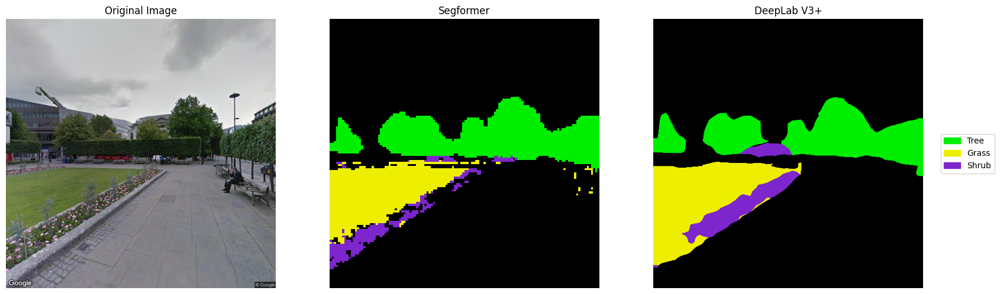

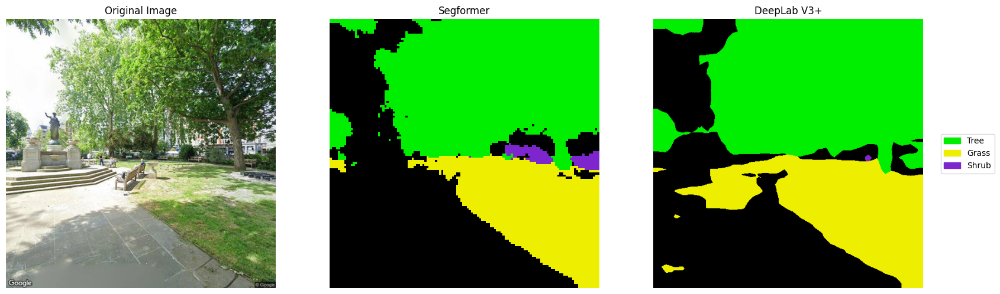

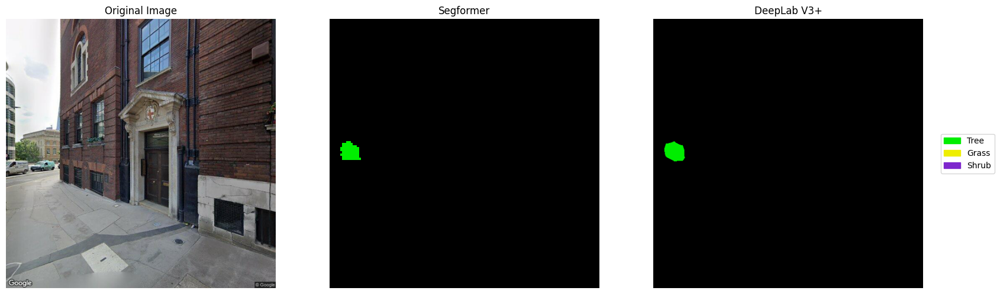

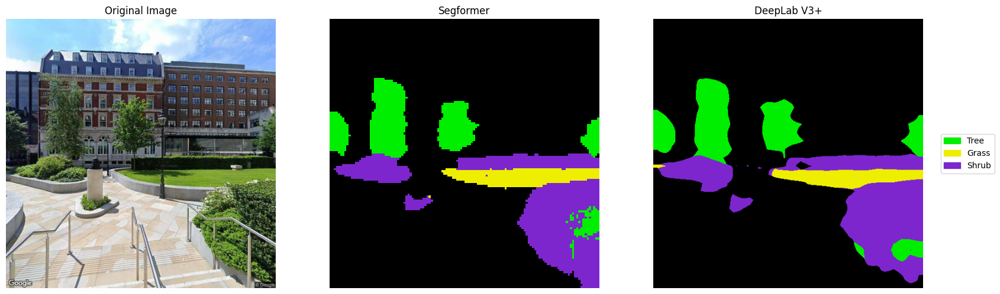

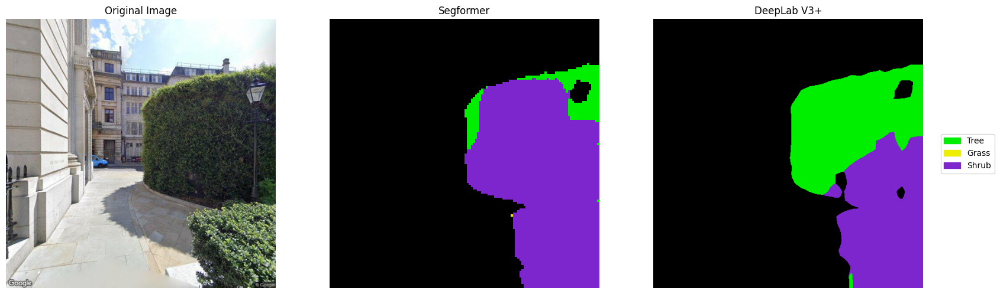

In [43]:
for image_file in image_files:

    # process jpg files
    if not image_file.lower().endswith('.jpg'):
        continue
    
    # read images
    image_path = os.path.join(image_dir, image_file)
    image = PILImage.open(image_path).convert('RGB')

    min_dim = min(image.size[0], image.size[1])
    image = image.resize((IMAGE_WIDTH * image.size[0] // min_dim,
                          IMAGE_HEIGHT * image.size[1] // min_dim))
    input_data = tf.expand_dims(image, axis=0)
    input_data = input_data[:, :IMAGE_WIDTH,:IMAGE_HEIGHT, :]
    input_data = tf.cast(input_data, tf.float32) / 128 - 0.5

    # segmentation for model 1
    output_data1 = model1(input_data).numpy()
    output_data1[~np.isin(output_data1, [tree1, grass1, shrub1])] = -1
    height1, width1 = output_data1[0].shape[:2]
    color_image1 = np.zeros((height1, width1, 3), dtype=np.uint8)
    for label, color in color_map.items():
        color_image1[output_data1[0] == label] = color

    # segmentation for model 2
    inputs = image_processor(images=image, return_tensors="tf")
    outputs = model2(**inputs, training=False)
    label_map2 = tf.argmax(outputs.logits, axis=1).numpy()
    label_map2[~np.isin(label_map2, [tree2, grass2, shrub2])] = -1
    height2, width2 = label_map2[0].shape[:2]
    color_image2 = np.zeros((height2, width2, 3), dtype=np.uint8)
    for label, color in color_map.items():
        color_image2[label_map2[0] == label] = color

    plt.figure(figsize=(20, 10))

    plt.subplot(1, 3, 1)
    plt.imshow(image)
    plt.axis('off')
    plt.title('Original Image')
    
    plt.subplot(1, 3, 2)
    plt.imshow(color_image2)
    plt.axis('off')
    plt.title('Segformer')
    
    plt.subplot(1, 3, 3)
    plt.imshow(color_image1)
    plt.axis('off')
    plt.title('DeepLab V3+')


    plt.legend(handles=legend_elements, bbox_to_anchor=(1.05, 0.5), loc='center left')
    
    plt.show()

# Results

In [19]:
import cv2
import torch

In [20]:
model_type = "DPT_Large" 

midas = torch.hub.load("intel-isl/MiDaS", model_type)
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
midas.to(device)
midas.eval()

midas_transforms = torch.hub.load("intel-isl/MiDaS", "transforms")
if model_type == "DPT_Large" or model_type == "DPT_Hybrid":
    transform = midas_transforms.dpt_transform
else:
    transform = midas_transforms.small_transform

Using cache found in C:\Users\win10/.cache\torch\hub\intel-isl_MiDaS_master
Using cache found in C:\Users\win10/.cache\torch\hub\intel-isl_MiDaS_master


# Depth ---method

In [26]:
image_dir_de= 'method_depth'

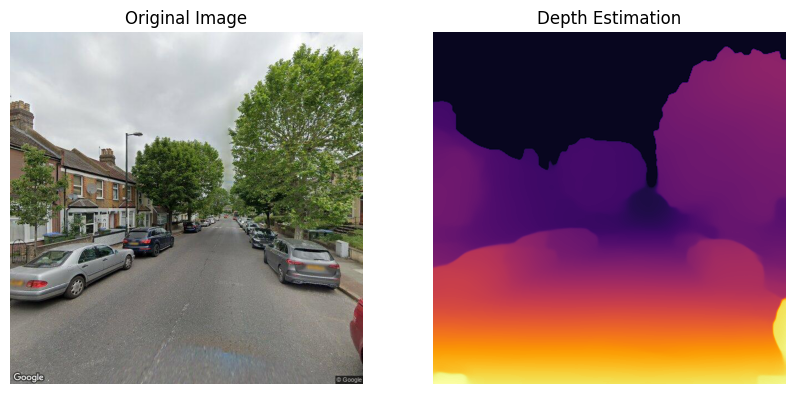

In [34]:
for image_file in os.listdir(image_dir_de):
    image_path = os.path.join(image_dir_de, image_file)
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    input_batch = transform(img).to(device)
    
    with torch.no_grad():
        prediction = midas(input_batch)
        prediction = torch.nn.functional.interpolate(
            prediction.unsqueeze(1),
            size=img.shape[:2],
            mode="bicubic",
            align_corners=False,
        ).squeeze()

    output = prediction.cpu().numpy()
    
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title('Original Image')

    plt.subplot(1, 2, 2)
    plt.imshow(output, cmap='inferno')
    plt.axis('off')
    plt.title('Depth Estimation')
    plt.show()

In [22]:
tree = 4
grass = 9
shrub=17

# Results--image segementation

In [48]:
image_dir = 'result_example'

result_example\GoogleSV_Greenwich_7758_180.png


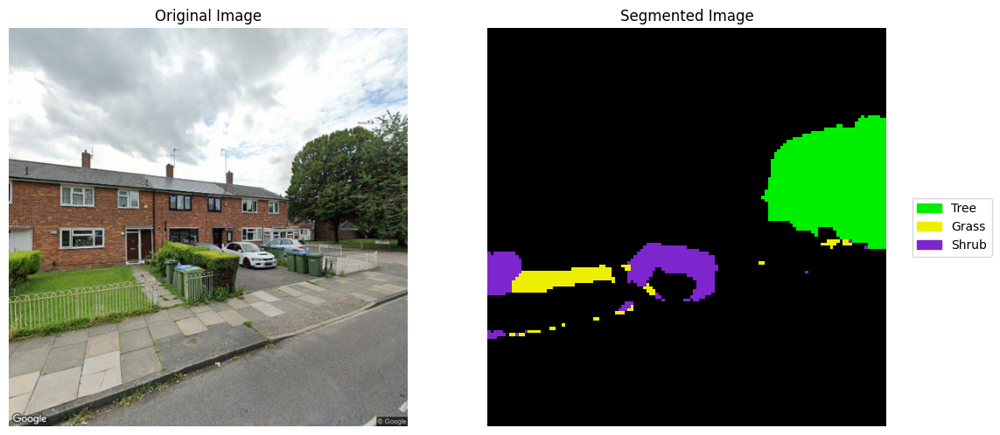

result_example\GoogleSV_Greenwich_7759_180.png


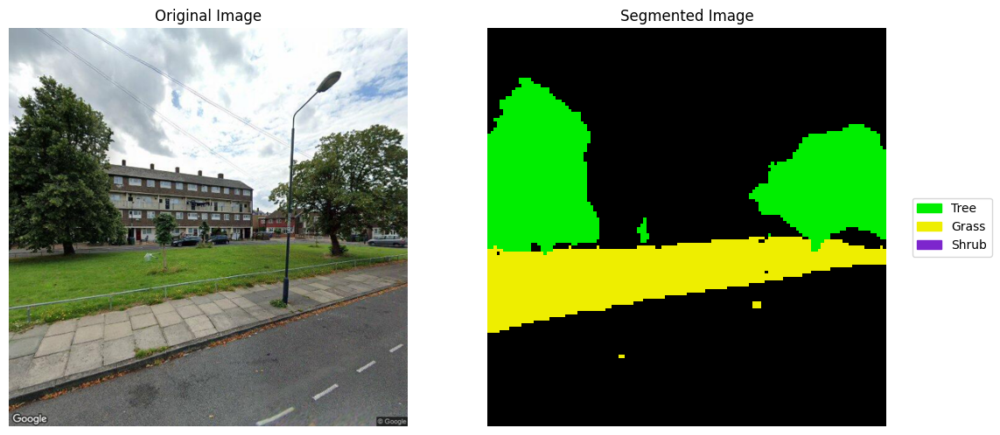

result_example\GoogleSV_Greenwich_7787_0.png


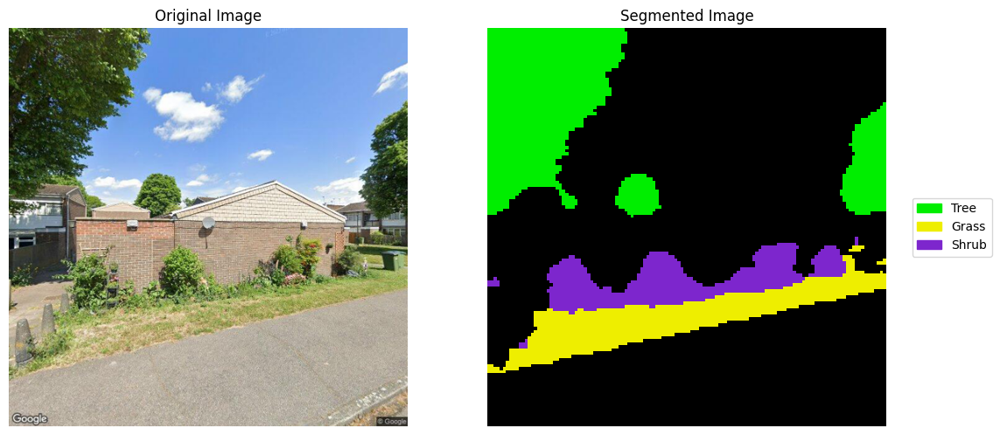

result_example\GoogleSV_Greenwich_7977_180.png


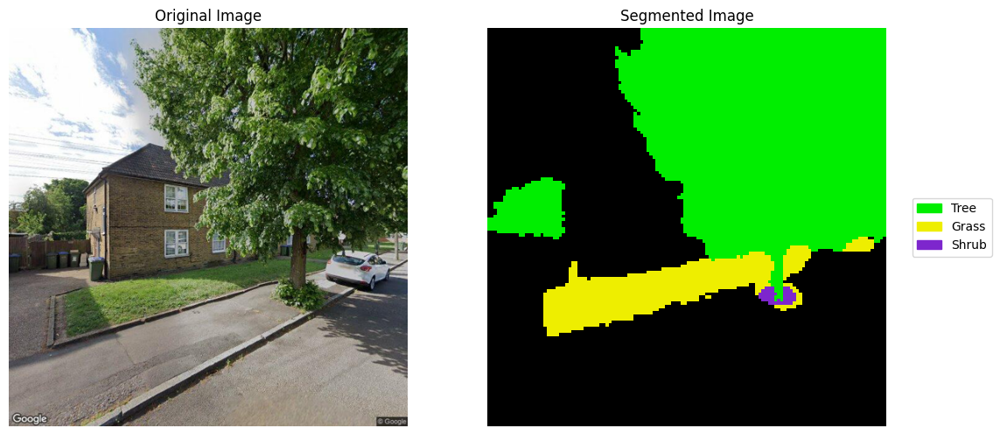

result_example\GoogleSV_Westminster_22729_90.png


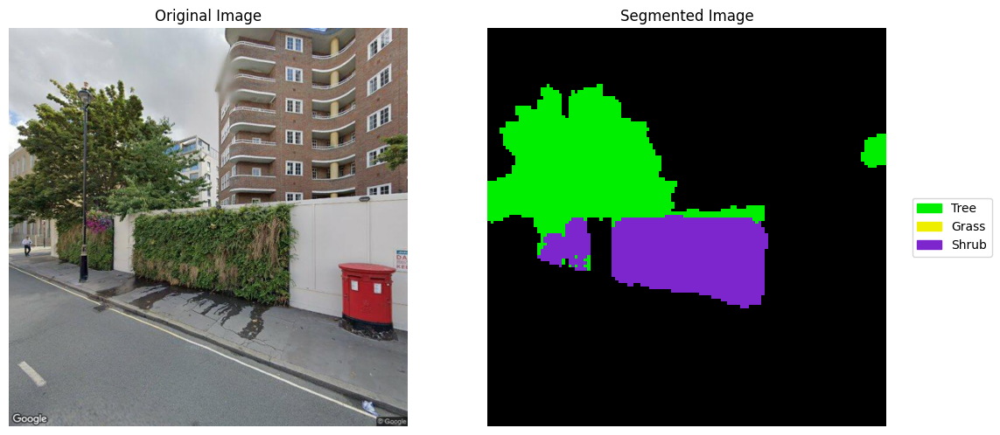

In [78]:
for image_file in os.listdir(image_dir):
    
    image_path = os.path.join(image_dir, image_file)
    print(image_path)
    image = PILImage.open(image_path).convert('RGB')
    min_dim = min(image.size[0], image.size[1])
    image = image.resize((IMAGE_WIDTH * image.size[0] // min_dim,
                          IMAGE_HEIGHT * image.size[1] // min_dim))
    
    input_data = tf.expand_dims(image, axis=0)
    input_data = input_data[:, :IMAGE_WIDTH,:IMAGE_HEIGHT, :]
    input_data = tf.cast(input_data, tf.float32) / 128 - 0.5

    # segmentation for model 1
    output_data1 = model1(input_data).numpy()
    output_data1[~np.isin(output_data1, [tree1, grass1, shrub1])] = -1
    height1, width1 = output_data1[0].shape[:2]
    color_image1 = np.zeros((height1, width1, 3), dtype=np.uint8)
    for label, color in color_map.items():
        color_image1[output_data1[0] == label] = color

    # segmentation for model 2
    inputs = image_processor(images=image, return_tensors="tf")
    outputs = model2(**inputs, training=False)
    label_map2 = tf.argmax(outputs.logits, axis=1).numpy()
    label_map2[~np.isin(label_map2, [tree2, grass2, shrub2])] = -1
    height2, width2 = label_map2[0].shape[:2]
    color_image2 = np.zeros((height2, width2, 3), dtype=np.uint8)
    for label, color in color_map.items():
        color_image2[label_map2[0] == label] = color

    plt.figure(figsize=(20, 10))

    plt.subplot(1, 3, 1)
    plt.imshow(image)
    plt.axis('off')
    plt.title('Original Image')

    plt.subplot(1, 3, 2)
    plt.imshow(color_image2)
    plt.axis('off')
    plt.title('Segmented Image')
    
    #plt.subplot(1, 3, 3)
    #plt.imshow(color_image1)
    #plt.axis('off')
    #plt.title('DeepLab V3+')


    plt.legend(handles=legend_elements, bbox_to_anchor=(1.05, 0.5), loc='center left')
    
    plt.show()

In [2]:
for image_file in os.listdir(image_dir):

    image_path = os.path.join(image_dir, image_file)
    img = Image.open(image_path)
    # convert to numpy array
    img_np = np.array(img)
    # segmente
    inputs = image_processor(images=img, return_tensors="tf")
    outputs = model2(**inputs, training=False)
    input_batch = transform(img_np).to(device)
    with torch.no_grad():
        prediction = midas(input_batch)

        # match image size
        prediction = torch.nn.functional.interpolate(
            prediction.unsqueeze(1),
            size=img.size,
            mode="bicubic",
            align_corners=False,
        ).squeeze()
    depth_output = prediction.cpu().numpy()
    # get the label map
    label_map = tf.argmax(outputs.logits, axis=1).numpy()
    total = 640*640
    label_map_first = label_map[0]
    # resize label map
    label_map_resized = cv2.resize(label_map_first, (prediction.shape[1], prediction.shape[0]), interpolation=cv2.INTER_NEAREST) 

    
    
    for label, label_name in zip([tree, grass, shrub], ['Tree', 'Grass', 'Shrub']):
        label_map_binary = (label_map_resized == label)
        num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(label_map_binary.astype('uint8'), connectivity=8)
        instance_counter = 0
        # calculate the percentage and depth
        for i in range(1, num_labels):
            instance_pixels = stats[i, -1]
            # ignore pixels larger than 225
            if instance_pixels > 225:
                instance_percentage = (instance_pixels / total) * 100
                instance_depth = depth_output[labels == i].mean()
                instance_counter += 1 
                mask = labels == i


                plt.figure(figsize=(15, 5))
                # orginal
                plt.subplot(1, 3, 1)
                plt.imshow(img)
                plt.axis('off')
                plt.title('Original Image')

                # mask
                plt.subplot(1, 3, 2)
                plt.imshow(mask,cmap='magma')
                plt.axis('off')
                plt.title(f'{label_name} {instance_counter} Mask')

                masked_depth = depth_output * mask
                masked_depth[~mask] = masked_depth.min()

                # depth
                plt.subplot(1, 3, 3)
                plt.imshow(masked_depth, cmap='inferno', vmin=masked_depth.min(), vmax=masked_depth.max())
                plt.axis('off')
                plt.title(f'{label_name} {instance_counter} Depth Map')
                
                plt.show()
                
                if label == 4:
                    print(f"tree {instance_counter} in {image_file}: {instance_percentage}%, average depth: {instance_depth}")
                if label == 9:
                    print(f"grass {instance_counter} in {image_file}: {instance_percentage}%, average depth: {instance_depth}")
                if label == 17:
                    print(f"shrub {instance_counter} in {image_file}: {instance_percentage}%, average depth: {instance_depth}")

NameError: name 'os' is not defined

In [1]:
# I acknowledge the use of ChatGPT 4.0 (Open AI, https://chat.openai.com) to debug.